# Plotting crashes on a map to see distribution.

## (Then differentiating between intersection and non-intersection related crashes to see most often
## causes for each.)

In [9]:

import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.colors as colors

import folium

from shapely.geometry import Point

crash_data = pd.read_csv("../data/CDOT_Crashes_2023.csv")

crash_data_clean = crash_data.dropna(subset=["Longitude", "Latitude"])

# Convert crash data to GeoDataFrame
geometry = gpd.points_from_xy(crash_data_clean['Longitude'], crash_data_clean["Latitude"])
crashes_gdf = gpd.GeoDataFrame(crash_data_clean, geometry=geometry, crs='EPSG:4326')



color_dict = {
    "At Intersection": "red",
    "Non-Intersection": "blue"
}

crashes_gdf['color'] = crashes_gdf['Road Description'].map(color_dict)
crashes_gdf['color'] = crashes_gdf['color'].fillna('gray')

#crashes_gdf.explore(color=crashes_gdf['color'], marker_kwds={'radius':1, 'fill':True})
crashes_gdf_intersection = crashes_gdf[(crashes_gdf['color'] == "red")]

crashes_gdf.explore(color=crashes_gdf['color'], marker_kwds={'radius':1, 'fill':True})


# Plotting histograms for the causes of intersection and non intersection related crashes

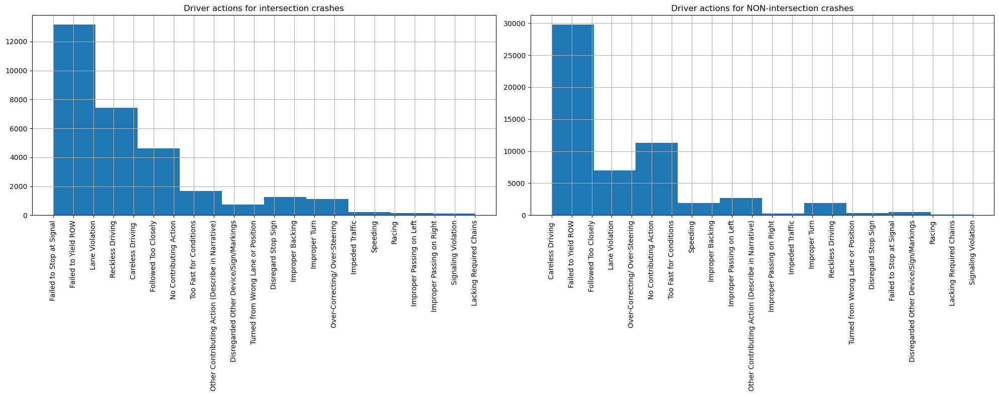

In [3]:

crashes_gdf_intersection = crashes_gdf[(crashes_gdf['color'] == "red")]
crashes_gdf_non_intersection = crashes_gdf[(crashes_gdf['color'] != "red")]



fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

crashes_gdf_intersection['TU-1 Driver Action'].hist(ax=ax1, figsize=(20,8), xlabelsize=10)
crashes_gdf_non_intersection['TU-1 Driver Action'].hist(ax=ax2, figsize=(20,8), xlabelsize=10)

ax1.tick_params(axis='x', rotation=90)
ax1.set_title("Driver actions for intersection crashes")

ax2.set_title("Driver actions for NON-intersection crashes")
ax2.tick_params(axis='x', rotation=90)

plt.tight_layout()
plt.show()

# Age connection for all crashes?

## (Want to add colorado age distribution to see if theyre similar)

  IBRC_Geo_ID Statefips Countyfips Description  Year Total Population  \
0        8000        08        000    Colorado  2019        5758736.0   

  Population 0-4 Population 5-17 Population 18-24 Population 25-44  \
0       332201.0        927318.0         526217.0        1711425.0   

  Population 45-64 Population 65+ Population Under 18 Population 18-54  \
0        1419163.0       842412.0           1259519.0        2943792.0   

  Population 55+ Male Population Female Population  
0      1555425.0       2900876.0         2857610.0  


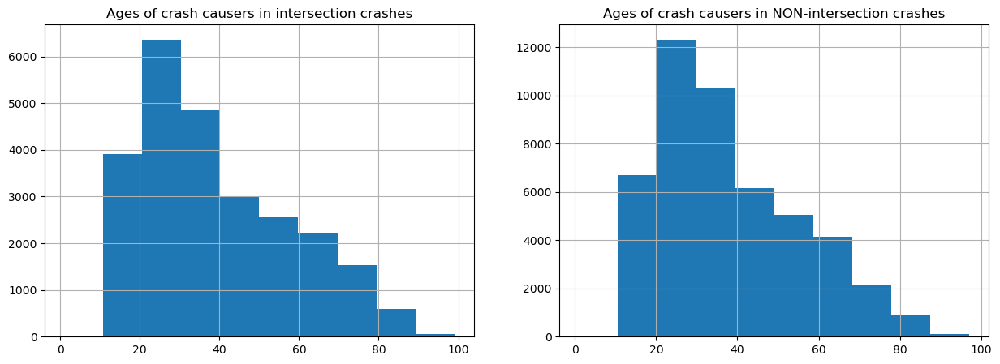

In [4]:
crashes_gdf_intersection_age = crashes_gdf_intersection[crashes_gdf_intersection["TU-1 Age"] > 0]
crashes_gdf_non_intersection_age = crashes_gdf_non_intersection[crashes_gdf_non_intersection["TU-1 Age"] > 0]

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))


crashes_gdf_intersection_age["TU-1 Age"].hist(ax=ax1)
ax1.set_title('Ages of crash causers in intersection crashes')


crashes_gdf_non_intersection_age["TU-1 Age"].hist(ax=ax2)
ax2.set_title("Ages of crash causers in NON-intersection crashes")


# Going to try to overlap population distribution to see if it is in sync with that
columnz =["IBRC_Geo_ID","Statefips","Countyfips","Description","Year","Total Population","Population 0-4","Population 5-17","Population 18-24","Population 25-44","Population 45-64","Population 65+","Population Under 18","Population 18-54","Population 55+","Male Population","Female Population"]

data = [["8000","08","000","Colorado","2019","5758736.0","332201.0","927318.0","526217.0","1711425.0","1419163.0","842412.0","1259519.0","2943792.0","1555425.0","2900876.0","2857610.0"]]

colorado_age_distribution = pd.DataFrame(data, columns=columnz)
print(colorado_age_distribution.head())

# Are there intersection related hot spots seen on a map where the cause was failing to stop at a sign or signal?

In [8]:
crashes_gdf_intersection_failed_stop = crashes_gdf_intersection[crashes_gdf_intersection['TU-1 Driver Action'] == "Failed to Stop at Signal"]

crashes_gdf_intersection_failed_stop.explore(color='red', marker_kwds={'radius':1, 'fill':True})

# Anything seen from the sex of crash causer?

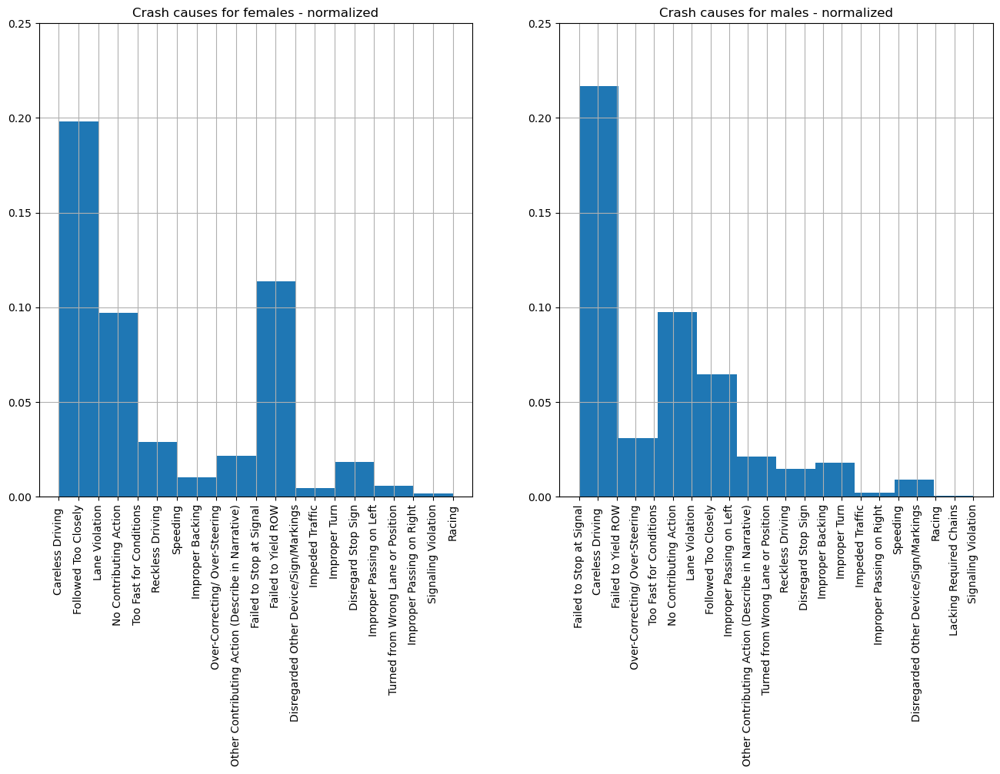

In [6]:
crash_causes_females = crashes_gdf[crashes_gdf['TU-1 Sex '] == "F"]
crash_causes_males = crashes_gdf[crashes_gdf['TU-1 Sex '] == "M"]

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

crash_causes_females["TU-1 Driver Action"].hist(ax=ax1, figsize=(16, 8), density=True)

crash_causes_males["TU-1 Driver Action"].hist(ax=ax2, figsize=(16, 8), density=True)

ax1.tick_params(axis="x", rotation=90)
ax2.tick_params(axis="x", rotation=90)

ax1.set_ylim([0, .25])
ax2.set_ylim([0, .25])

ax1.set_title("Crash causes for females - normalized")
ax2.set_title("Crash causes for males - normalized")

plt.show()

# Going to integrate weather conditions into this later

In [7]:
from datetime import datetime
from meteostat import Hourly, Stations

stations = Stations()
stations = stations.nearby(39.7677,-104.97499)
station = stations.fetch(1)
print(station)

start = datetime(2023,10,28,0,0)
end = datetime(2023,11,1,0,0)

data = Hourly('72469', start, end)
data = data.fetch()
print(data)

                                        name country region    wmo  icao  \
id                                                                         
72469  Denver / Stapleton International, Co.      US     CO  72469  KDNR   

       latitude  longitude  elevation        timezone hourly_start hourly_end  \
id                                                                              
72469   39.7833  -104.8667     1626.0  America/Denver   1940-05-15 1995-03-01   

      daily_start  daily_end monthly_start monthly_end     distance  
id                                                                   
72469  1940-05-15 2023-09-19    1940-01-01  2021-01-01  9415.592068  


                     temp  dwpt  rhum  prcp  snow   wdir  wspd  wpgt    pres  \
time                                                                           
2023-10-28 00:00:00   5.3  -7.6  39.0   0.0   NaN   73.0  20.4   NaN  1017.6   
2023-10-28 01:00:00   4.7  -8.1  39.0   0.0   NaN   67.0  22.2   NaN  1018.5   
2023-10-28 02:00:00   4.1  -8.3  40.0   0.0   NaN   58.0  24.1   NaN  1019.4   
2023-10-28 03:00:00   3.8  -8.3  41.0   0.0   NaN   65.0  25.9   NaN  1019.3   
2023-10-28 04:00:00   3.8  -8.3  41.0   0.0   NaN   76.0  22.2   NaN  1018.6   
...                   ...   ...   ...   ...   ...    ...   ...   ...     ...   
2023-10-31 20:00:00   6.6 -10.6  28.0   0.0   NaN   45.0  11.1   NaN  1025.8   
2023-10-31 21:00:00   6.5 -10.7  28.0   0.0   NaN   60.0   9.3   NaN  1026.0   
2023-10-31 22:00:00   6.9  -7.5  35.0   0.0   NaN   39.0   7.4   NaN  1022.9   
2023-10-31 23:00:00   6.8  -8.8  32.0   0.0   NaN  158.0   5.5   NaN  1023.5   
2023-11-01 00:00:00   5.7  -8.2  36.0   